# This notebook allows to generate graphs for each superclass and for each lead
## get_data_ready_for_training() needs to be temporarily modified to select only the ecg data belonging to one class

y = y_data[y_data["diagnostic_superclass"].apply(lambda x: len(x) == 1)]
y = y_data[y_data["diagnostic_superclass"].apply(lambda x: x == ['STTC'])]
X = load_raw_data(y, sampling_rate, dataset_path)

In [1]:
from scripts.data_preparation import get_data_ready_for_training

sampling_rate = 100
dataset_path = "ecg_dataset/"

(
    X_train,
    X_val,
    X_test,
    y_train,
    y_val,
    y_test,
    multi_label_binarizer,
) = get_data_ready_for_training(dataset_path=dataset_path, sampling_rate=sampling_rate)

Loaded labels
Loaded ECG signals
Reshaped ECG signals to: (1000, 12)
Split training data into training|validation


1/180
2/180
3/180
4/180
5/180
6/180
7/180
8/180
9/180
10/180
11/180
12/180
13/180
14/180
15/180
16/180
17/180
18/180
19/180
20/180


C:\ECG Anomaly Detection\scripts\ecg_visualization_biosspy.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_raw, axs_raw = plt.subplots(3, 1, sharex=True)


21/180
22/180
23/180
24/180
25/180
26/180
27/180
28/180
29/180
30/180
31/180
32/180
33/180
34/180
35/180
36/180
37/180
38/180
39/180
40/180
41/180
42/180
43/180
44/180
45/180
46/180
47/180
48/180
49/180
50/180
51/180
52/180
53/180
54/180
55/180
56/180
57/180
58/180
59/180
60/180
61/180
62/180
63/180
64/180
65/180
66/180
67/180
68/180
69/180
70/180
71/180
72/180
73/180
74/180
75/180
76/180
77/180
78/180
79/180
80/180
81/180
82/180
83/180
84/180
85/180
86/180
87/180
88/180
89/180
90/180
91/180
92/180
93/180
94/180
95/180
96/180
97/180
98/180
99/180
100/180
101/180
102/180
103/180
104/180
105/180
106/180
107/180
108/180
109/180
110/180
111/180
112/180
113/180
114/180
115/180
116/180
117/180
118/180
119/180
120/180
121/180
122/180
123/180
124/180
125/180
126/180
127/180
128/180
129/180
130/180
131/180
132/180
133/180
134/180
135/180
136/180
137/180
138/180
139/180
140/180
141/180
142/180
143/180
144/180
145/180
146/180
147/180
148/180
149/180
150/180
151/180
152/180
153/180
154/180
155/180

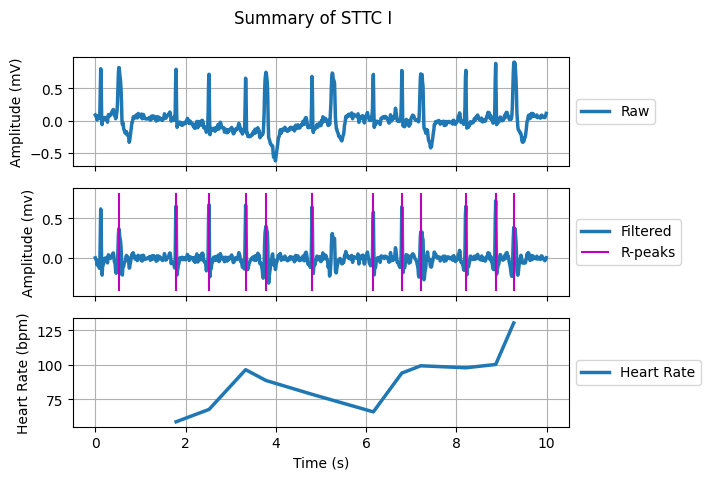

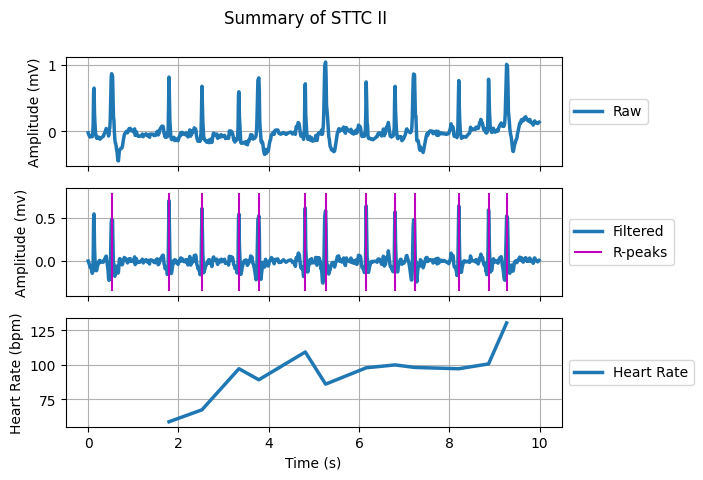

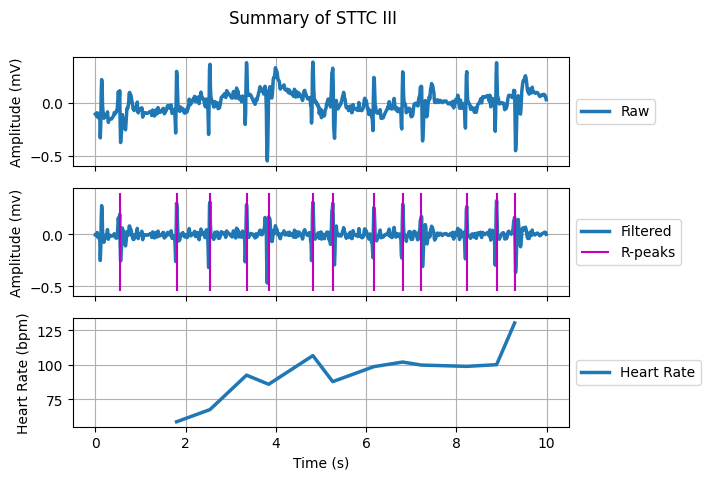

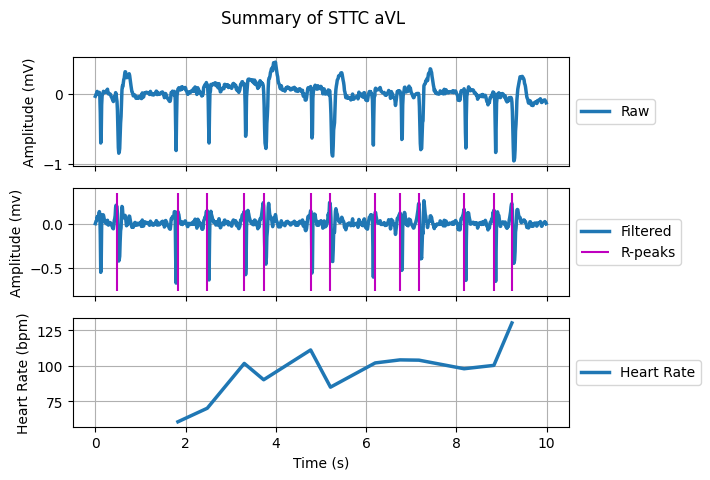

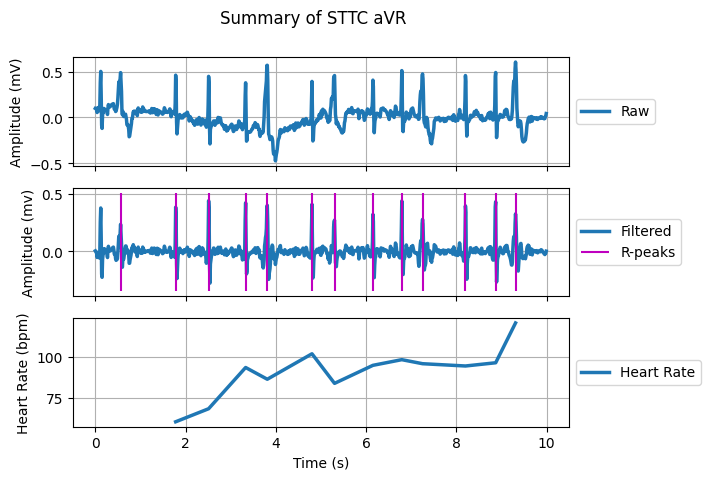

...

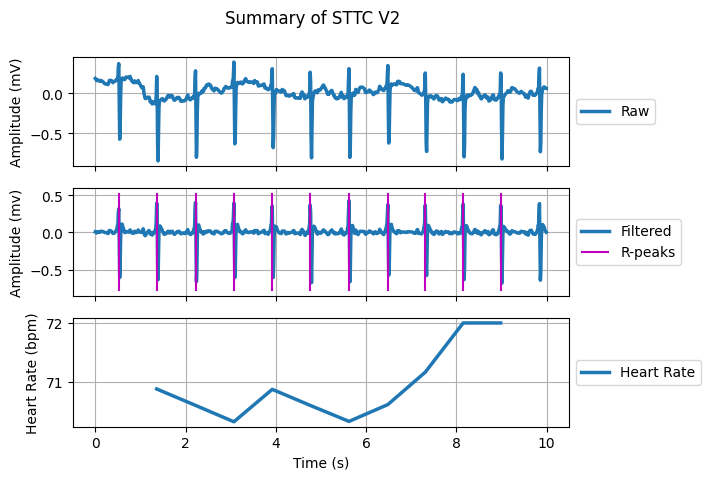

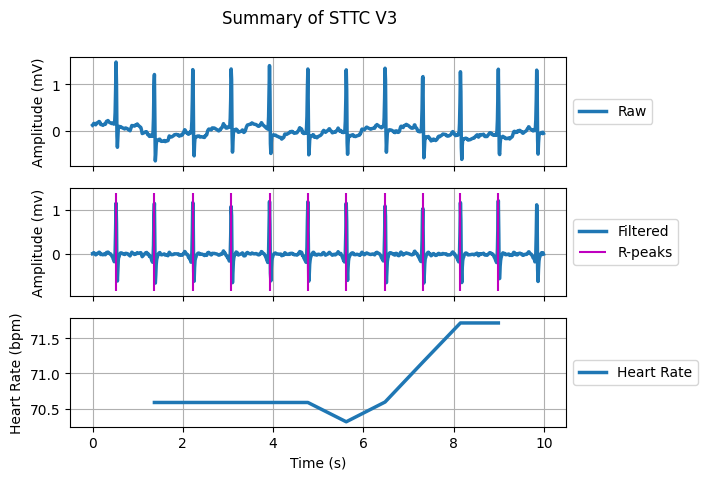

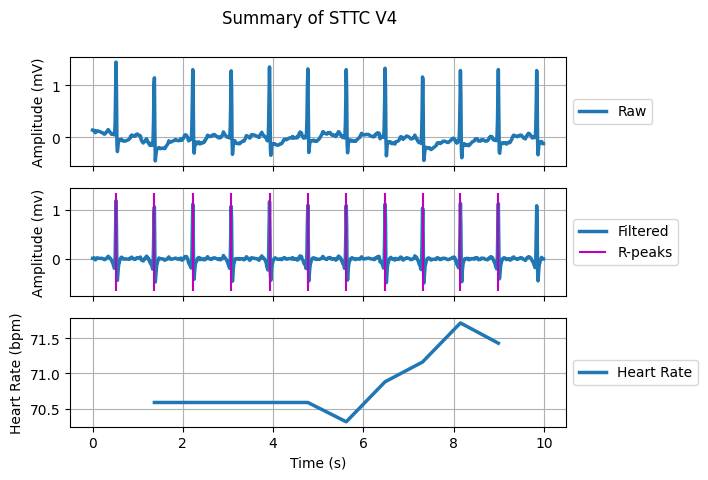

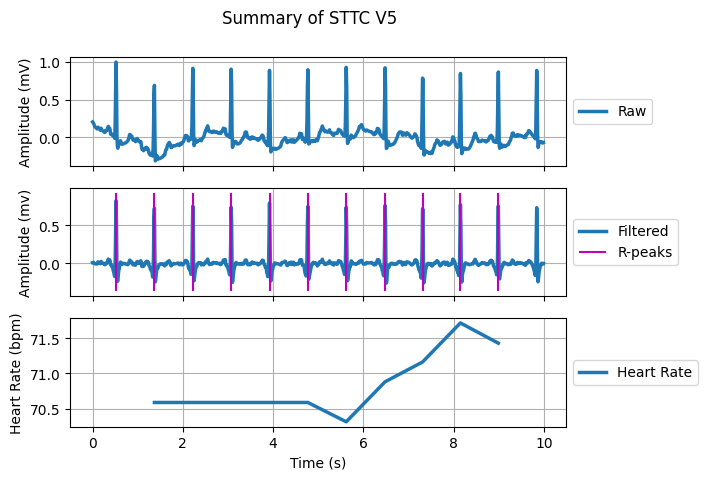

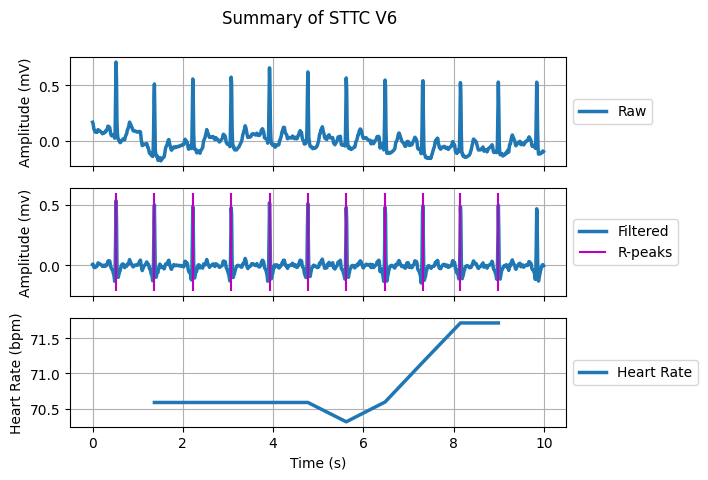

In [2]:
from biosppy.signals import ecg
from scripts.ecg_visualization_biosspy import generate_ecg_plots

leads = ["I", "II", "III", "aVL", "aVR", "aVF", "V1", "V2", "V3", "V4", "V5", "V6"]
index = 0
number_of_patients = 15

for patient_number in range(number_of_patients):
    for lead_number, lead_name in enumerate(leads):
        patient_lead_data = X_train[patient_number, :, lead_number]
        (
            ts_axis_reference,
            filtered_ecg_signal,
            r_peaks,
            templates_ts,
            templates,
            heart_rate_ts,
            heart_rate,
        ) = ecg.ecg(
            signal=patient_lead_data, sampling_rate=100, show=False, interactive=False
        )

        generate_ecg_plots(
            ts=ts_axis_reference,
            raw=patient_lead_data,
            filtered=filtered_ecg_signal,
            rpeaks=r_peaks,
            templates_ts=templates_ts,
            templates=templates,
            heart_rate_ts=heart_rate_ts,
            heart_rate=heart_rate,
            diagnostic=multi_label_binarizer.classes_[0],
            lead=lead_name,
            save_plot=True,
        )
        index += 1
        print(f"{index}/180")